![](http://mf-data-science.fr/images/projects/banniere.jpg)

# Segmentation de clients (Olist) - Partie 1 : exploration et préparation des données
---

Olist est un site de e-commerce qui une segmentation des clients à des fins de campagnes de communication. Ces catégories pourront être utilisées par l’équipe marketing pour mieux communiquer. L'objectif est donc de comprendre les différents types d’utilisateurs grâce à leur comportement et à leurs données personnelles anonymisées.

---

Dans cette première partie nous allons explorer les données qui sont à notre disposer, les nettoyer et les préparer afin de réaliser la segmentation et son évaluation dans une seconde partie.

## Introduction
### Import des librairies

In [1]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from folium.plugins import HeatMap
import warnings
import regex as re
import scipy.stats as stats
from IPython.display import display, Markdown
import networkx as nx
import unidecode

### Configuation

In [2]:
warnings.filterwarnings("ignore")
pd.set_option('display.max_columns', 500) 

sns.set_theme(style="ticks")

STORAGE_PATH = "../data/"

### Import des données

In [3]:
files_list = [file for file in os.listdir(STORAGE_PATH) if file.endswith(".csv")]

datasets_list = list()
print(f"Datasets list\n{14*'-'}")
for file in files_list:
    name = re.sub('olist_|_dataset|.csv', '', file)
    locals()[name] = pd.read_csv(os.path.join(STORAGE_PATH, file))
    print(name)
    datasets_list.append(name)

Datasets list
--------------
sellers
product_category_name_translation
orders
order_items
customers
geolocation
order_payments
order_reviews
order_data
products


### Analyse de la structure des données

![image.png](https://i.imgur.com/HRhd2Y0.png)

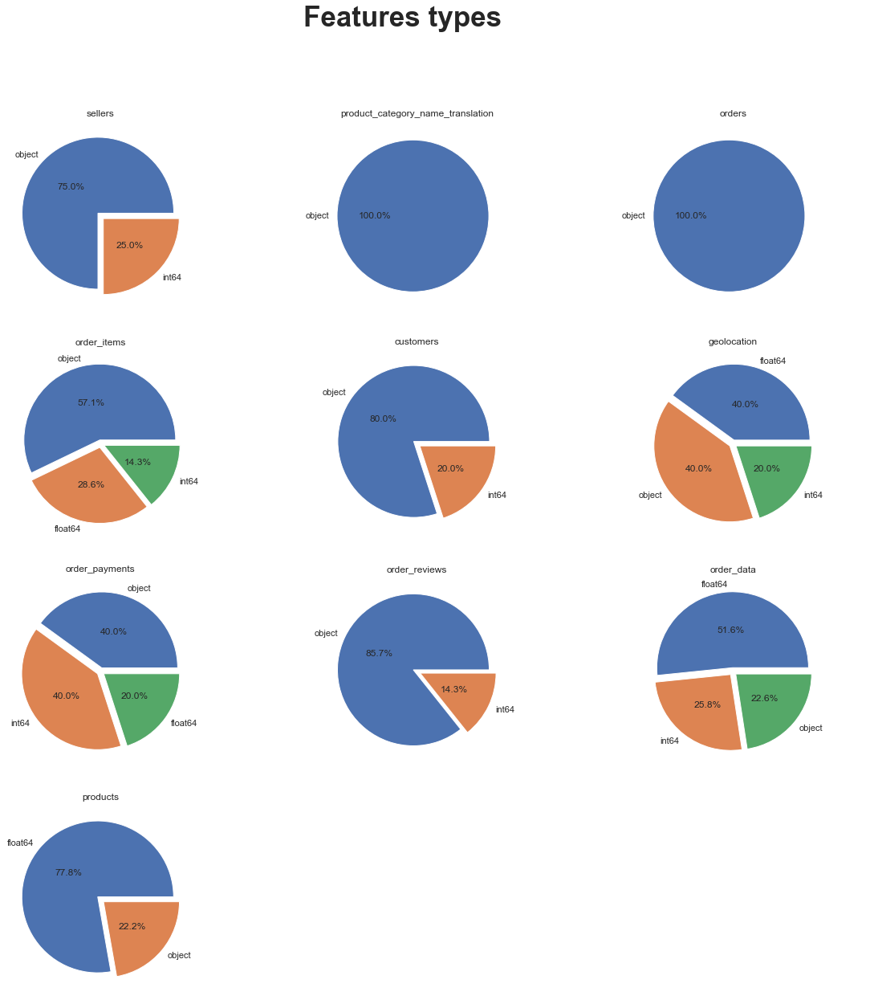

In [4]:
fig, ax = plt.subplots(4, 3, figsize=(20, 20))
plt.suptitle('Features types', weight='bold', size=35)
j = -1
k=0
for i, data in enumerate(datasets_list):
    k+=1
    j += 1 if i % 3 == 0 else 0
    k = 0 if i % 3 == 0 else k
    dtypes = locals()[data].dtypes.value_counts()
    if i < len(datasets_list):
        ax[j, k].pie(x = dtypes.values, 
                     labels=dtypes.index, 
                     autopct='%1.1f%%', 
                     explode=[0.05]*len(dtypes), 
                     pctdistance=0.5)
        ax[j, k].set_title(data)
ax[3, 1].axis('off')
ax[3, 2].axis('off')
plt.show()

### Rassemblement des tables
Le dataset est composé 11 tables de données. Il convient dès lors de les rassembler.

In [5]:
data = order_items
print(data.shape)

# order_payments
data = pd.merge(left=data, right=order_payments, on= 'order_id', how='outer', suffixes=(None, '_order_payments'))
print(data.shape)

# orders
data = pd.merge(left=data, right=orders, on= 'order_id', how='outer', suffixes=(None, '_orders'))
print(data.shape)

# order_reviews
data = pd.merge(left=data, right=order_reviews, on= 'order_id', how='outer', suffixes=(None, '_order_reviews'))
print(data.shape)

# products
data = pd.merge(left=data, right=products, on= 'product_id', how='left', suffixes=(None, '_products'))
print(data.shape)

# product_category_name_translation
data = pd.merge(left=data, right=product_category_name_translation, on= 'product_category_name', how='left', suffixes=(None, '_product_category_name_translation'))
print(data.shape)

# customers
data = pd.merge(left=data, right=customers, on= 'customer_id', how='outer', suffixes=(None, '_order_payments'))
print(data.shape)

# sellers
data = pd.merge(left=data, right=sellers, on= 'seller_id', how='outer', suffixes=(None, '_order_payments'))
print(data.shape)

# geolocation 
geolocation = geolocation.drop_duplicates(subset='geolocation_zip_code_prefix')

# geolocation (customer)
data = pd.merge(left=data, right=geolocation.add_suffix('_customer'), 
                left_on= 'customer_zip_code_prefix', right_on='geolocation_zip_code_prefix_customer',
                how='left')
print(data.shape)

# geolocation (seller)
data = pd.merge(left=data, right=geolocation.add_suffix('_seller'), 
                left_on= 'seller_zip_code_prefix', right_on='geolocation_zip_code_prefix_seller',
                how='left')

print(data.shape)

(112650, 7)
(118434, 11)
(118434, 18)
(119151, 24)
(119151, 32)
(119151, 33)
(119151, 37)
(119151, 40)
(119151, 45)
(119151, 50)


## Analyse préliminaire

In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 119151 entries, 0 to 119150
Data columns (total 50 columns):
 #   Column                                Non-Null Count   Dtype  
---  ------                                --------------   -----  
 0   order_id                              119151 non-null  object 
 1   order_item_id                         118318 non-null  float64
 2   product_id                            118318 non-null  object 
 3   seller_id                             118318 non-null  object 
 4   shipping_limit_date                   118318 non-null  object 
 5   price                                 118318 non-null  float64
 6   freight_value                         118318 non-null  float64
 7   payment_sequential                    119148 non-null  float64
 8   payment_type                          119148 non-null  object 
 9   payment_installments                  119148 non-null  float64
 10  payment_value                         119148 non-null  float64
 11  

In [7]:
customer_map = folium.Map(location=[-22.498183, -44.123614],zoom_start=4)
geo_customer_orders = data.groupby(['geolocation_lat_customer', 'geolocation_lng_customer']).customer_unique_id.nunique().reset_index()
folium.plugins.HeatMap(
    data = geo_customer_orders[['geolocation_lat_customer', 'geolocation_lng_customer', 'customer_unique_id']].values,
    radius =2,
    blur =1, 
).add_to(customer_map)
customer_map 

In [8]:
data.customer_id.nunique()

99441

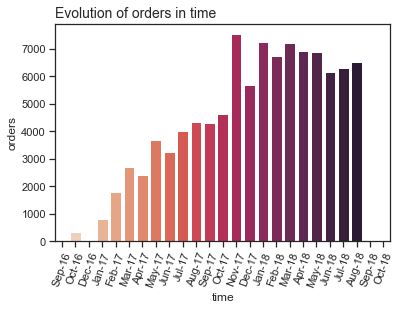

In [9]:
data.order_purchase_timestamp = pd.to_datetime(data.order_purchase_timestamp)
data['order_purchase_month'] = pd.to_datetime(data.order_purchase_timestamp.dt.strftime('%m-%y'), format='%m-%y')
_ = data.groupby('order_purchase_month').order_id.nunique().sort_index()

fig, ax = plt.subplots()
sns.barplot(x = _.index, y=_.values, ax=ax, palette="rocket_r")
ax.set_xticklabels(pd.Series(_.index).dt.strftime('%b-%y').tolist())
ax.set_title('Evolution of orders in time', size=14, loc='left')
ax.tick_params(axis='x', rotation=70)
ax.set_xlabel('time')
ax.set_ylabel('orders')
plt.show()

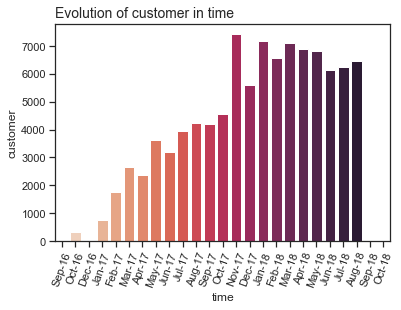

In [10]:
_ = data.groupby('order_purchase_month').customer_unique_id.nunique().sort_index()
fig, ax = plt.subplots()
sns.barplot(x = _.index, y=_.values, ax=ax, palette="rocket_r")
ax.set_xticklabels(pd.Series(_.index).dt.strftime('%b-%y').tolist())
ax.set_title('Evolution of customer in time', size=14, loc='left')
ax.tick_params(axis='x', rotation=70)
ax.set_xlabel('time')
ax.set_ylabel('customer')
plt.show()

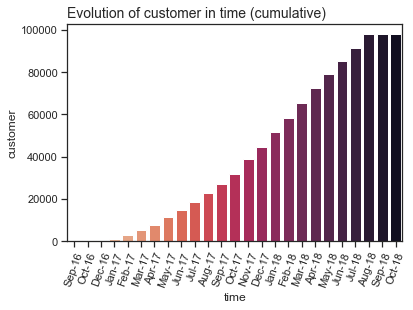

In [11]:
_ = data.groupby('order_purchase_month').customer_unique_id.nunique().sort_index().cumsum()
fig, ax = plt.subplots()
sns.barplot(x = _.index, y=_.values, ax=ax, palette="rocket_r")
ax.set_xticklabels(pd.Series(_.index).dt.strftime('%b-%y').tolist())
ax.set_title('Evolution of customer in time (cumulative)', size=14, loc='left')
ax.tick_params(axis='x', rotation=70)
ax.set_xlabel('time')
ax.set_ylabel('customer')
plt.show()

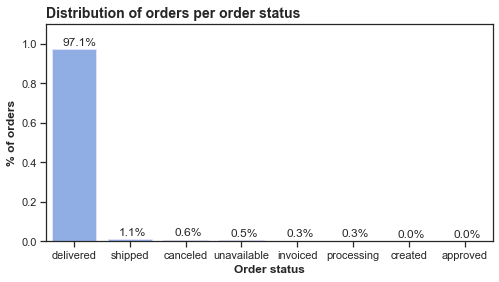

In [12]:
plt.figure(figsize=(8, 4))
_ = data.order_status.value_counts(normalize=True, dropna=False)

plt.title('Distribution of orders per order status', weight='bold', size=14, loc='left')
sns.barplot(_.index, _.values, color="cornflowerblue", edgecolor="lavender", alpha = 0.8) 
plt.xlabel('Order status', weight='bold', size = 12)
plt.ylabel('% of orders', weight='bold', size = 12)

for i in range(len(_)):
    plt.text(x = i - 0.20,
             y = _.iloc[i] + 0.02,
             s = f'{_.iloc[i]:.1%}',
             rotation = 0)
plt.gca().set_ylim([0,1.1])
plt.show()

## Nettoyage des données

In [13]:
# normalization of text order_data
def clean_text(text):
    try: 
        return unidecode.unidecode(text.lower().strip())
    except AttributeError:
        return np.NaN
    
for column in data.select_dtypes('object').columns:
    data[column] = data[column].apply(clean_text)

In [14]:
# remove non delivered orders
data = data[(data.order_status == "delivered") & (data.product_id.notna())]
# drop duplicates
print(data.shape)
data.drop(columns=['review_id', 'review_creation_date', 'review_answer_timestamp'], inplace=True)
data.drop_duplicates(inplace=True)

data.reset_index(drop=True, inplace=True)
data.shape

(115731, 51)


(115464, 48)

## Préparation des données

In [15]:
order_data = pd.DataFrame(index = data.order_id.unique())
order_data['customer_id'] = data.groupby('order_id').customer_unique_id.unique()
order_data.customer_id = order_data.customer_id.apply(lambda x: x[0])
order_data['number_product'] = data.groupby('order_id').order_item_id.max()

# payment 
order_data['number_unique_product'] = data.groupby('order_id').product_id.nunique()
order_data['number_sequential_payments'] = data.groupby('order_id').payment_sequential.max()
order_data = order_data.loc[~order_data.number_sequential_payments.isna()]
order_data['number_payment_installments'] = data.groupby('order_id').payment_installments.max()
order_data['number_payment_types'] = data.groupby('order_id').payment_type.nunique()

one_payment = data.loc[data.order_id.isin(order_data.loc[order_data.number_sequential_payments ==1].index)]
several_payment = data.loc[data.order_id.isin(order_data.loc[order_data.number_sequential_payments > 1].index)]
print((several_payment.groupby('order_id').price.nunique() > 1).sum())
several_payment.drop_duplicates(['order_id', 'price', 'freight_value'], inplace=True)
order_data['order_price'] = pd.concat([several_payment.groupby('order_id').price.sum(), one_payment.groupby('order_id').price.sum()])
order_data['order_freight_value'] = pd.concat([several_payment.groupby('order_id').freight_value.sum(), one_payment.groupby('order_id').freight_value.sum()])

# time
order_id_unique = data.drop_duplicates('order_id').set_index('order_id')
delivery_duration_days = (pd.to_datetime(order_id_unique.order_delivered_customer_date) - pd.to_datetime(order_id_unique.order_purchase_timestamp)).apply(lambda x:x.days)
order_data['delivery_duration'] = delivery_duration_days
order_data['order_purchase_timestamp'] = pd.to_datetime(order_id_unique.order_purchase_timestamp)

# review score
order_data['review_score'] = data.groupby('order_id').review_score.mean()
order_data['number_review_comment_message'] = data.groupby('order_id').review_comment_message.nunique()

# product description
data.product_category_name_english.fillna('unknown', inplace=True)
categories = {"fashio|luggage": 'fashion_clothing_accessories',
              "health|beauty|perfum": 'health_beauty', "toy|baby|diaper": 'toys_baby',
              "book|cd|dvd|media": 'books_cds_media', 
              "grocer|food|drink": 'groceries_food_drink', 
              "phon|compu|tablet|electro|consol": 'technology',
              "home|furnitur|garden|bath|house|applianc": 'home_furniture',
              "flow|gift|stuff":'books_cds_media',
              "sport": 'sport'}

for pattern, values in categories.items():
    data.loc[data.product_category_name_english.str.contains(pattern), 'product_category_name_english'] = values
data.loc[~ data.product_category_name_english.str.contains(f"{'|'.join(categories.keys())}|unknown"), 'product_category_name_english'] = "other"

order_data['number_product_categories'] = data.groupby('order_id').product_category_name_english.nunique()
order_data['product_photos_qty'] = data.groupby('order_id').product_photos_qty.sum()
order_data['order_weight'] = data.groupby('order_id').product_weight_g.sum()

product_length_cm = data.groupby('order_id').product_length_cm.sum()
product_height_cm = data.groupby('order_id').product_height_cm.sum()
product_width_cm = data.groupby('order_id').product_width_cm.sum()
order_data['order_volume'] = product_height_cm * product_length_cm * product_width_cm

# customer localisation
order_data['customer_city'] = order_id_unique.customer_city
order_data['customer_lat'] = order_id_unique.geolocation_lat_customer
order_data['customer_lng'] = order_id_unique.geolocation_lng_customer

order_data.reset_index(inplace=True)
order_data.rename(columns={'index': 'order_id'}, inplace=True)

order_data.shape

88


(96477, 20)

## EDA

### Missing values

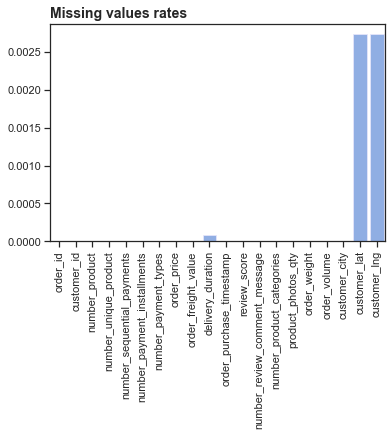

In [16]:
plt.figure()
_ = order_data.isna().sum() / len(order_data)
plt.title('Missing values rates', weight='bold', size=14, loc='left')
sns.barplot(_.index, _.values, color="cornflowerblue", edgecolor="lavender", alpha = 0.8) 
plt.xticks(rotation=90)

plt.show()

In [17]:
for column in order_data.columns[order_data.isna().sum() > 0]:
    order_data[column] = order_data[column].fillna(order_data[column].mean())

### Types

In [18]:
for column in order_data.columns:
    if order_data[column].dtypes.name == 'int64':
        order_data[column] = order_data[column].astype('float64')

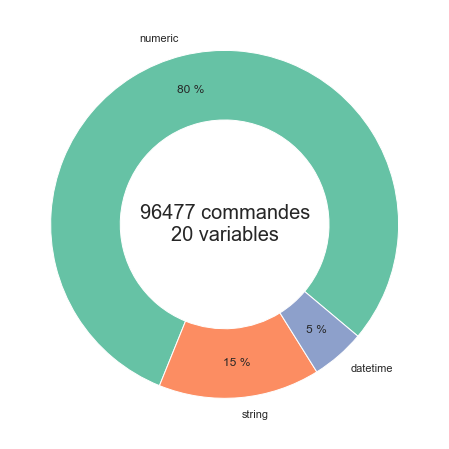

In [19]:
colors = [(102, 194, 165), (252, 141, 98), (141, 160, 203), (231, 138,195),  
          (166, 216, 84), (255, 217, 47), (171, 197, 233), (252, 205, 229)]

for icol in range(len(colors)):
    red,green,blue = colors[icol]
    colors[icol] = (red / 255., green / 255., blue / 255.)
    
fig, ax = plt.subplots(figsize=(8, 8))
dtypes = order_data.dtypes.value_counts()
ax.pie(x = dtypes.values, 
        labels=['numeric', 'string', 'datetime'],
       wedgeprops={'width':0.4}, 
       startangle=-40,
        autopct='%1.f %%',
       pctdistance=0.80,
colors = colors)
plt.text(0, 0, f"{len(order_data)} commandes\n{order_data.shape[1]} variables", ha='center', va='center', fontsize=20)

plt.show()

### Nombre de commande par client

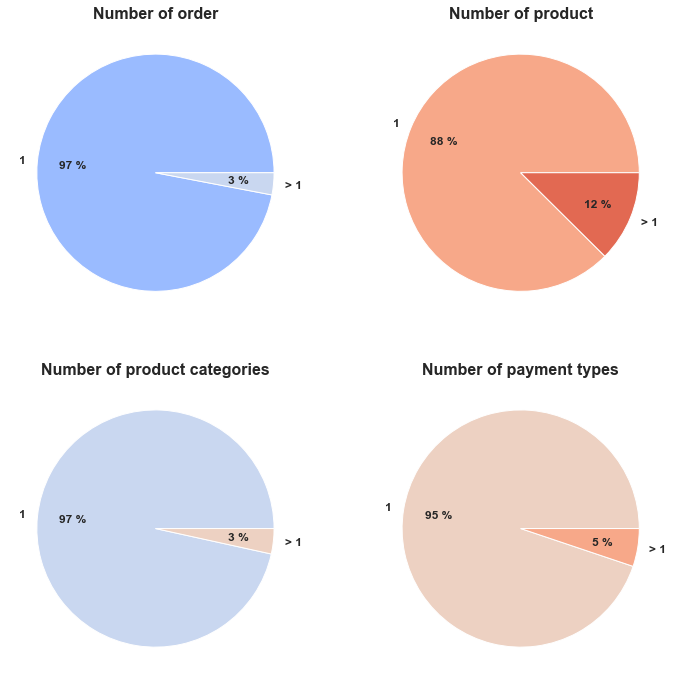

In [20]:
colors = sns.color_palette('coolwarm')

plt.figure(figsize=(12, 12))
plt.subplot(2, 2, 1)
_ = order_data.groupby('customer_id').order_id.nunique()
_ = pd.cut(_, [0, 1, max(_)], labels=['1',  '> 1'], include_lowest=True)
_ = _.value_counts(normalize=False, dropna=False).sort_index()

plt.pie(x = _.values, labels= _.index, autopct='%1.f %%', 
        startangle=0,  pctdistance=0.7, colors = colors[1:], 
        textprops={'fontsize': 12, 'weight': 'bold'})

plt.title('Number of order', weight='bold', size=16)

plt.subplot(2, 2, 2)
_ = order_data.groupby('customer_id').number_product.sum()
_ = pd.cut(_, [0, 1, max(_)], labels=['1',  '> 1'], include_lowest=True)
_ = _.value_counts(normalize=False, dropna=False).sort_index()

plt.pie(x = _.values, labels= _.index, autopct='%1.f %%', 
        startangle=0,  pctdistance=0.7, colors = colors[4:], 
        textprops={'fontsize': 12, 'weight': 'bold'})

plt.title('Number of product', weight='bold', size=16)

plt.subplot(2, 2, 3)
_ = order_data.groupby('customer_id').number_product_categories.sum()
_ = pd.cut(_, [0, 1, max(_)], labels=['1',  '> 1'], include_lowest=True)
_ = _.value_counts(normalize=False, dropna=False).sort_index()

plt.pie(x = _.values, labels= _.index, autopct='%1.f %%', 
        startangle=0,  pctdistance=0.7, colors = colors[2:], 
        textprops={'fontsize': 12, 'weight': 'bold'})

plt.title('Number of product categories', weight='bold', size=16)

plt.subplot(2, 2, 4)
_ = order_data.groupby('customer_id').number_payment_types.sum()
_ = pd.cut(_, [0, 1, max(_)], labels=['1',  '> 1'], include_lowest=True)
_ = _.value_counts(normalize=False, dropna=False).sort_index()

plt.pie(x = _.values, labels= _.index, autopct='%1.f %%', 
        startangle=0,  pctdistance=0.7, colors = colors[3:], 
        textprops={'fontsize': 12, 'weight': 'bold'})

plt.title('Number of payment types', weight='bold', size=16)

plt.show()

### Order purchase timestamp

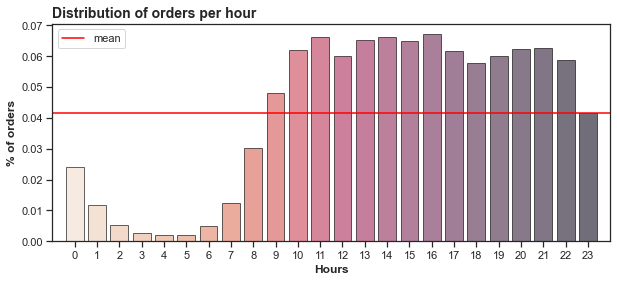

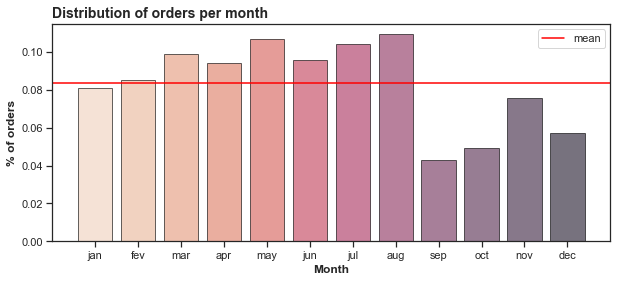

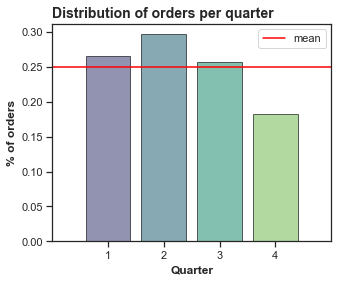

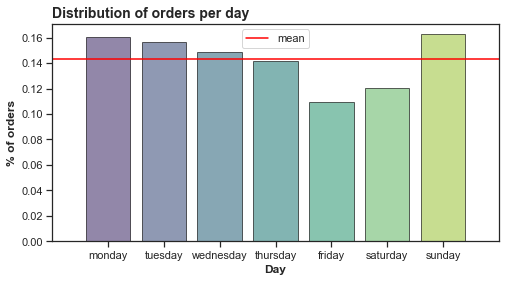

In [21]:
dayofweek = {1:'monday', 2:'tuesday', 3:'wednesday',4 :'thursday', 5:'friday', 6:'saturday', 0:'sunday'}
month = {1:'jan', 2:'fev', 3:'mar', 4:'apr', 5:'may', 6:'jun', 7:'jul', 8:'aug', 9:'sep', 10:'oct', 11:'nov', 12:'dec'}

order_data.order_purchase_timestamp = pd.to_datetime(order_data.order_purchase_timestamp)

order_data['order_purchase_hour'] = order_data.order_purchase_timestamp.dt.hour
order_data['order_purchase_day'] = order_data.order_purchase_timestamp.dt.dayofweek.apply(lambda x: dayofweek[x])
order_data['order_purchase_month'] = order_data.order_purchase_timestamp.dt.month.apply(lambda x: month[x])
order_data['order_purchase_quarter'] = order_data.order_purchase_timestamp.dt.quarter

plt.figure(figsize=(10, 4))
_ = order_data.order_purchase_hour.value_counts(normalize=True, dropna=False)

plt.title('Distribution of orders per hour', weight='bold', size=14, loc='left')
sns.barplot(_.index, _.values, palette="rocket_r", edgecolor="black", alpha = 0.6) 
plt.xlabel('Hours', weight='bold', size = 12)
plt.ylabel('% of orders', weight='bold', size = 12)
plt.xticks(np.arange(0, 24))
sns.lineplot(x = [_.index.min() -1, _.index.max() + 1], y = _.values.mean(), color='red', label='mean')
plt.margins(x=0)
plt.show()

plt.figure(figsize=(10, 4))
_ = order_data.order_purchase_month.value_counts(normalize=True, dropna=False).reindex(month.values())

plt.title('Distribution of orders per month', weight='bold', size=14, loc='left')
sns.barplot(_.index, _.values, palette="rocket_r", edgecolor="black", alpha = 0.6) 
plt.xlabel('Month', weight='bold', size = 12)
plt.ylabel('% of orders', weight='bold', size = 12)
sns.lineplot(x = [-1, len(_)], y = _.values.mean(), color='red', label='mean')
plt.margins(x=0)
plt.show()

plt.figure(figsize=(5, 4))
_ = order_data.order_purchase_quarter.value_counts(normalize=True, dropna=False)

plt.title('Distribution of orders per quarter', weight='bold', size=14, loc='left')
sns.barplot(_.index, _.values, palette="viridis", edgecolor="black", alpha = 0.6) 
plt.xlabel('Quarter', weight='bold', size = 12)
plt.ylabel('% of orders', weight='bold', size = 12)
sns.lineplot(x = [-1, len(_)], y = _.values.mean(), color='red', label='mean')
plt.margins(x=0)
plt.show()

plt.figure(figsize=(8, 4))
_ = order_data.order_purchase_day.value_counts(normalize=True, dropna=False).reindex(dayofweek.values())

plt.title('Distribution of orders per day', weight='bold', size=14, loc='left')
sns.barplot(_.index, _.values, palette="viridis", edgecolor="black", alpha = 0.6) 
plt.xlabel('Day', weight='bold', size = 12)
plt.ylabel('% of orders', weight='bold', size = 12)
sns.lineplot(x = [-1, len(_)], y = _.values.mean(), color='red', label='mean')
plt.margins(x=0)
plt.show()

### Delivery duration 

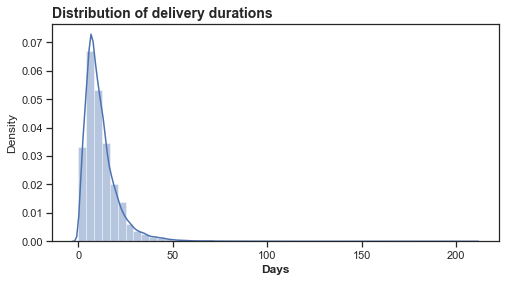

In [22]:
plt.figure(figsize=(8, 4))
plt.title('Distribution of delivery durations', weight='bold', size=14, loc='left')
sns.distplot(order_data.delivery_duration)
plt.xlabel('Days', weight='bold', size = 12)
plt.show()

### Price et freight value

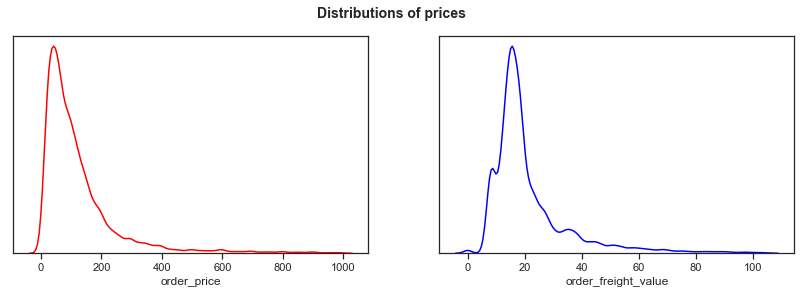

In [23]:
fig, ax = plt.subplots(1, 2, figsize=(14, 4))

fig.suptitle('Distributions of prices', weight='bold', size=14)
_ = order_data.loc[order_data.order_price <= order_data.order_price.quantile(0.99), 'order_price']
sns.distplot(_, color="red", hist=False, ax = ax[0])
ax[0].set_yticks([])
ax[0].set_ylabel('')

_ = order_data.loc[order_data.order_freight_value <= order_data.order_freight_value.quantile(0.99), 'order_freight_value']
sns.distplot(_, color="blue", hist=False, ax = ax[1])
ax[1].set_yticks([])
ax[1].set_ylabel('')

plt.show()

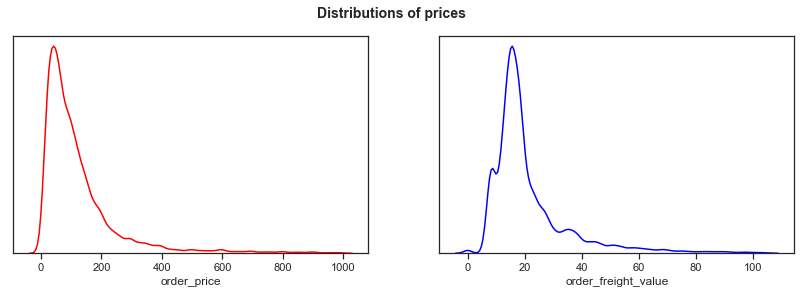

In [24]:
fig, ax = plt.subplots(1, 2, figsize=(14, 4))

fig.suptitle('Distributions of prices', weight='bold', size=14)
_ = order_data.loc[order_data.order_price <= order_data.order_price.quantile(0.99), 'order_price']
sns.distplot(_, color="red", hist=False, ax = ax[0])
ax[0].set_yticks([])
ax[0].set_ylabel('')

_ = order_data.loc[order_data.order_freight_value <= order_data.order_freight_value.quantile(0.99), 'order_freight_value']
sns.distplot(_, color="blue", hist=False, ax = ax[1])
ax[1].set_yticks([])
ax[1].set_ylabel('')

plt.show()

### Payments installments

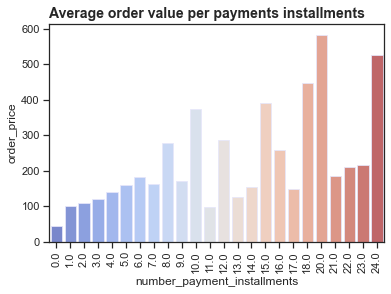

In [25]:
plt.figure(figsize=(6, 4))
plt.title('Average order value per payments installments', weight='bold', size=14, loc='left')
sns.barplot(
    x = order_data.number_payment_installments,
    y = order_data.order_price, palette='coolwarm', 
    edgecolor="lavender", alpha = 0.8, ci=None)
plt.xticks(rotation=90)
plt.show()

### Number of payment sequential

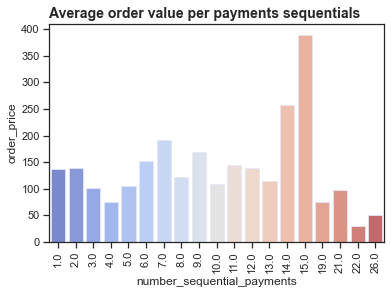

In [26]:
plt.figure(figsize=(6, 4))
plt.title('Average order value per payments sequentials', weight='bold', size=14, loc='left')
sns.barplot(
    x = order_data.number_sequential_payments,
    y = order_data.order_price, palette='coolwarm', 
    edgecolor="lavender", alpha = 0.8, ci=None)
plt.xticks(rotation=90)
plt.show()

### Payment type

In [27]:
payment_types = data.groupby('order_id').payment_type.unique()
payment_type_dummies = pd.get_dummies(payment_types.apply(pd.Series).stack()).sum(level=0)

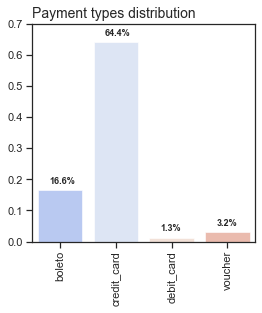

In [28]:
plt.figure(figsize=(4, 4))
plt.title('Payment types distribution', size=14, loc='left')
_ = payment_type_dummies.sum(axis=0) / len(data)
sns.barplot(_.index, _.values, palette='coolwarm', alpha = 0.6)

for i in range(len(_)):
    plt.text(x = i - 0.2,
             y = _.iloc[i]+0.02,
             s = f'{_.iloc[i]:.1%}',
             rotation = 0,
             size=9,
             weight='bold')
plt.gca().set_ylim([0,.7])
plt.xticks(rotation=90)
plt.show()

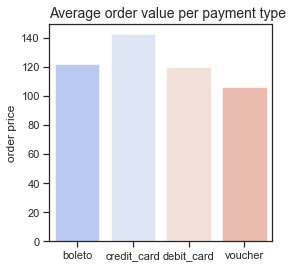

In [29]:
_ = payment_type_dummies.merge(order_data.set_index('order_id').order_price, left_index=True, right_index=True)
y = [_.groupby('boleto').order_price.mean()[1],
 _.groupby('credit_card').order_price.mean()[1],
 _.groupby('debit_card').order_price.mean()[1],
 _.groupby('voucher').order_price.mean()[1],
]
x = ['boleto', 'credit_card', 'debit_card', 'voucher']

plt.figure(figsize=(4, 4))
plt.title('Average order value per payment type', size=14, loc='left')
sns.barplot(x, y, palette='coolwarm', alpha = 0.6) 
plt.ylabel('order price')
plt.show()

### Review score

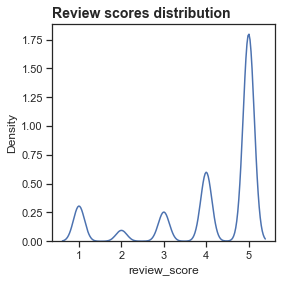

In [30]:
plt.figure(figsize=(4, 4))
plt.title('Review scores distribution', weight='bold', size=14, loc='left')
sns.distplot(order_data.review_score, hist=False)
plt.show()

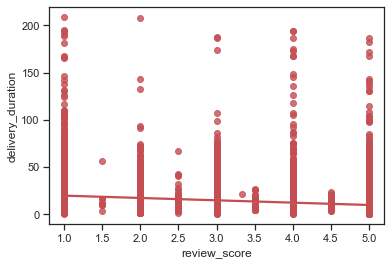

In [31]:
sns.regplot(x=order_data.review_score, y=order_data.delivery_duration, color='r')
plt.show()

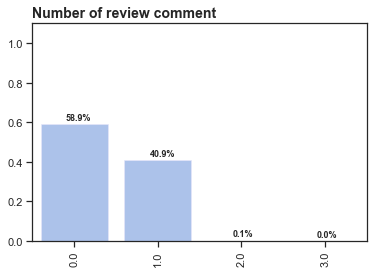

In [32]:
plt.figure(figsize=(6, 4))
plt.title('Number of review comment', weight='bold', size=14, loc='left')
_ = order_data.number_review_comment_message.value_counts(normalize=True, dropna=False)
sns.barplot(_.index, _.values, color="cornflowerblue", edgecolor="lavender", alpha = 0.6)

for i in range(len(_)):
    plt.text(x = i - 0.1,
             y = _.iloc[i]+0.02,
             s = f'{_.iloc[i]:.1%}',
             rotation = 0,
             size=9,
             weight='bold')
plt.gca().set_ylim([0,1.1])
plt.xticks(rotation=90)
plt.show()

### Customer city

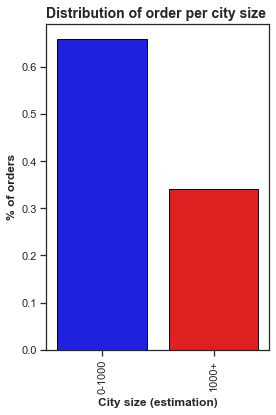

In [33]:
_ = order_data.customer_city.value_counts()
_ = dict(pd.cut(_, [0, 1000, max(_)], labels=["0-1000", '1000+'], include_lowest=True))
order_data['city_pop_dico'] = order_data.customer_city.apply(lambda x: _[x])

_ = order_data.city_pop_dico.value_counts(normalize=True)
plt.figure(figsize=(4, 6))
plt.title('Distribution of order per city size', weight='bold', size=14, loc='left')
sns.barplot(_.index, _.values, palette=['blue', 'red'], edgecolor="black") 
plt.xlabel('City size (estimation)', weight='bold', size = 12)
plt.ylabel('% of orders', weight='bold', size = 12)
plt.xticks(rotation=90)
plt.show()

In [34]:
customer_map = folium.Map(location=[-22.498183, -44.123614], zoom_start=5)
for index, row in order_data.dropna().sample(5000).iterrows():
    lat = row['customer_lat']
    lng = row['customer_lng']
    city_group = row['city_pop_dico']
    if city_group == '0-1000':
        folium.Circle(location=[lat, lng], popup=city_group, color='red', fill=True).add_to(customer_map)
    else:
        folium.Circle(location=[lat, lng], popup=city_group, color='blue', fill=True).add_to(customer_map)
        
customer_map

## Feature engineering

### Order purchase timestamp

In [35]:
order_data['order_purchase_night'] = (order_data.order_purchase_hour < 9).astype(int)
order_data['order_purchase_winter'] = order_data.order_purchase_month.isin(['sep', 'oct', 'nov', 'dec']).astype(int)

### Payment type

In [36]:
order_data = order_data.merge(payment_type_dummies.add_prefix('payment_type_').reset_index(), on='order_id')

## Base client

In [37]:
def get_customer_data(order_data:pd.DataFrame, months_to_remove:int):
    
    order_data.order_purchase_timestamp = pd.to_datetime(order_data.order_purchase_timestamp)
    last_order_time = order_data.order_purchase_timestamp.max()
    last_order_time = last_order_time - pd.DateOffset(months=months_to_remove)
    
    new_order_data = order_data.loc[order_data.order_purchase_timestamp <= last_order_time]
    
    print("Number of orders removed:", len(order_data) - len(new_order_data))
        
    new_order_data['last_order_3m'] = (new_order_data.order_purchase_timestamp > (new_order_data.order_purchase_timestamp.max() - pd.DateOffset(months=3))).astype(int)
    new_order_data['last_order_6m'] = (new_order_data.order_purchase_timestamp > (new_order_data.order_purchase_timestamp.max() - pd.DateOffset(months=6))).astype(int)
    
    customer_data = pd.DataFrame(index = new_order_data.customer_id.unique())
    
    # order
    customer_data['number_order'] = new_order_data.groupby('customer_id').order_id.nunique()
    customer_data['average_order_value'] = new_order_data.groupby('customer_id').order_price.mean()
    customer_data['order_weight'] = new_order_data.groupby('customer_id').order_weight.mean()
    customer_data["order_volume"] = new_order_data.groupby('customer_id').order_volume.mean()
        
    # order time
    customer_data['number_order_last_3m'] = new_order_data.groupby('customer_id').last_order_3m.sum()
    customer_data['number_order_last_6m'] = new_order_data.groupby('customer_id').last_order_6m.sum()
    customer_data['last_order_days'] = (new_order_data.order_purchase_timestamp.max() - new_order_data.sort_values('order_purchase_timestamp').drop_duplicates('customer_id', keep='last').set_index('customer_id').order_purchase_timestamp).dt.days
    customer_data["order_purchase_night"] = new_order_data.groupby('customer_id').order_purchase_night.mean()                   
    customer_data["order_purchase_winter"] = new_order_data.groupby('customer_id').order_purchase_winter.mean()
    
    # delivery
    customer_data['freight_value'] = new_order_data.groupby('customer_id').order_freight_value.mean()
    customer_data["delivered_duration"] = new_order_data.groupby('customer_id').delivery_duration.mean()
    
    # payment
    customer_data['payment_sequential'] = new_order_data.groupby('customer_id').number_sequential_payments.mean()
    customer_data['number_payment_types'] = new_order_data.groupby('customer_id').number_payment_types.mean()
    customer_data['payment_installments'] = new_order_data.groupby('customer_id').number_payment_installments.mean()
    customer_data["payment_type_boleto"] = new_order_data.groupby('customer_id').payment_type_boleto.mean()
    customer_data["payment_type_credit_card"] = new_order_data.groupby('customer_id').payment_type_credit_card.mean()
    customer_data["payment_type_debit_card"] = new_order_data.groupby('customer_id').payment_type_debit_card.mean()
    customer_data["payment_type_voucher"] = new_order_data.groupby('customer_id').payment_type_voucher.mean()
    
    # review
    customer_data['number_review_message'] = new_order_data.groupby('customer_id').number_review_comment_message.mean()
    customer_data['review_score'] = new_order_data.groupby('customer_id').review_score.mean()
    
    # product
    customer_data['product_photos_qty'] = new_order_data.groupby('customer_id').product_photos_qty.mean()
    customer_data["product_categories"] = new_order_data.groupby("customer_id").number_product_categories.mean()
    customer_data['number_product'] = new_order_data.groupby('customer_id').number_product.mean()
    customer_data['number_unique_product'] = new_order_data.groupby('customer_id').number_unique_product.mean()
    
    # customer location
    city_pop = dict(new_order_data.groupby('customer_city').customer_id.nunique())
    new_order_data['city_pop'] = new_order_data.customer_city.apply(lambda x : city_pop[x])
    customer_data['city_pop'] = new_order_data.groupby('customer_id').city_pop.mean()
    
    return customer_data

In [38]:
customer_data = get_customer_data(order_data, months_to_remove=0)

Number of orders removed: 0


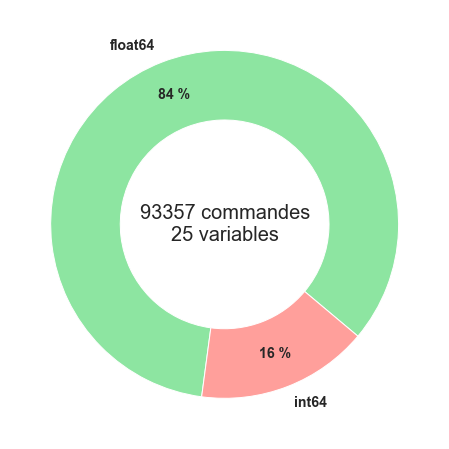

In [39]:
colors = sns.color_palette('pastel')

fig, ax = plt.subplots(figsize=(8, 8))
dtypes = customer_data.dtypes.value_counts()

ax.pie(x = dtypes.values, 
        labels=dtypes.index,
       wedgeprops={'width':0.4}, 
       startangle=-40,
        autopct='%1.f %%',
       pctdistance=0.80, colors = colors[2:], textprops={'fontsize': 14, 'weight': 'bold'})
plt.text(0, 0, f"{len(customer_data)} commandes\n{customer_data.shape[1]} variables", ha='center', va='center', fontsize=20)

plt.show()

### Client type

In [40]:
for column in customer_data.columns:
    print(column + ':', round(customer_data[column].mean(), 3))

number_order: 1.033
average_order_value: 137.463
order_weight: 2518.605
order_volume: 160767.668
number_order_last_3m: 0.203
number_order_last_6m: 0.421
last_order_days: 236.937
order_purchase_night: 0.094
order_purchase_winter: 0.224
freight_value: 22.768
delivered_duration: 12.102
payment_sequential: 1.045
number_payment_types: 1.022
payment_installments: 2.915
payment_type_boleto: 0.199
payment_type_credit_card: 0.77
payment_type_debit_card: 0.015
payment_type_voucher: 0.038
number_review_message: 0.411
review_score: 4.14
product_photos_qty: 2.6
product_categories: 1.005
number_product: 1.14
number_unique_product: 1.037
city_pop: 3020.111


In [41]:
order_data.groupby('customer_id').customer_city.unique().apply(lambda x: x[0]).value_counts(normalize=True).iloc[0]

0.1554462975459794

### Matrice de corrélation

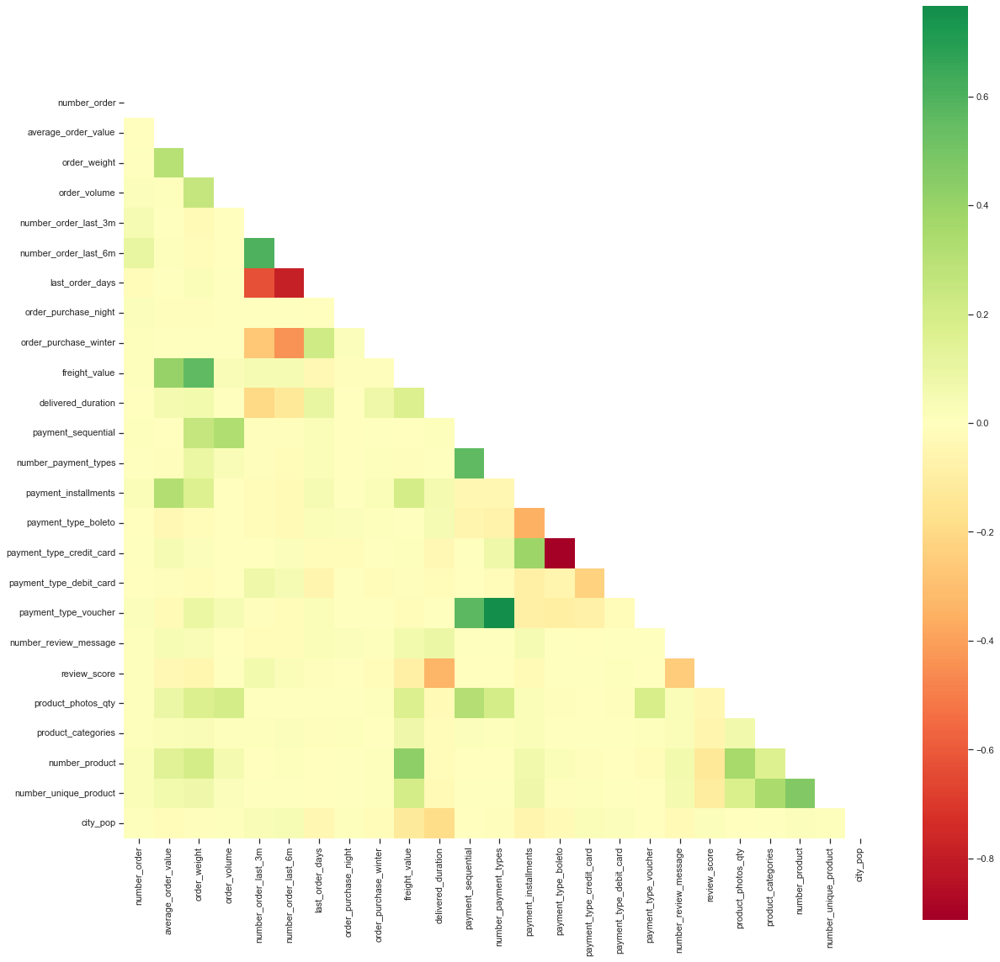

In [51]:
plt.figure(figsize = (20, 20))
matrix = customer_data.corr()
mask = np.triu(np.ones_like(matrix, dtype=bool))
sns.heatmap(matrix, cmap = 'RdYlGn', center = 0, square=True, mask = mask)
plt.show()

## Enregistrement des données

In [42]:
order_data.shape

(96477, 31)

In [43]:
order_data.to_csv('../data/order_data.csv', index=False)